In [1]:
#Install Packages
!pip install -U textblob
!pip install catboost

!pip uninstall scikit-learn -y
!pip install -U scikit-learn
!pip install shap

Found existing installation: scikit-learn 1.3.0
Uninstalling scikit-learn-1.3.0:
  Successfully uninstalled scikit-learn-1.3.0
  Using cached scikit_learn-1.3.0-cp310-cp310-win_amd64.whl (9.2 MB)


In [2]:
pip install lightgbm

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [4]:
from xgboost import XGBRegressor

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesRegressor
import catboost as cb
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from lightgbm import LGBMRegressor
from sklearn.ensemble import GradientBoostingRegressor
from datetime import datetime
import time
import calendar
import random
import nltk
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from textblob import Word
import shap
import IPython
import warnings
warnings.filterwarnings('ignore')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package stopwords to C:\Users\Dhananjeyan M
[nltk_data]     S\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\Dhananjeyan M
[nltk_data]     S\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to C:\Users\Dhananjeyan M
[nltk_data]     S\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [6]:
#Read the data set
sources= ['Facebook', 'GooglePlus', 'LinkedIn']
topics = ['Economy','Microsoft', 'Obama', 'Palestine']

folder_path = 'D:/Dissertation/news/Data/'
master_df = pd.read_csv(folder_path+'News_Final.csv')
df = {}
for source in sources:
  for topic in topics:
    file_name = f'{source}_{topic}.csv'
    file_path = f'{folder_path}{file_name}'
    df[f'{source}_{topic}'] = pd.read_csv(file_path)

In [7]:
df['Facebook_Obama'].head()

,IDLink,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,...,TS135,TS136,TS137,TS138,TS139,TS140,TS141,TS142,TS143,TS144
0,61874.0,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,748,748,748,748,748,748,748,748,748,748
1,61875.0,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,546,546,546,546,546,546,546,546,546,546
2,61876.0,-1,-1,-1,-1,-1,-1,44,45,48,...,140,140,140,140,140,140,140,140,140,140
3,61877.0,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,176,176,176,176,176,176,176,176,176,176
4,61878.0,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,206,206,206,206,206,206,206,206,206,206


In [8]:
df['Facebook_Obama'].tail()

,IDLink,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,...,TS135,TS136,TS137,TS138,TS139,TS140,TS141,TS142,TS143,TS144
27010,104796.0,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,0,0,0,0,0,0,0,0,0,0
27011,104797.0,-1,-1,-1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27012,104798.0,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,33,33,33,33,33,33,33,33,33,33
27013,104801.0,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,0,0,0,0,0,0,0,0,0,0
27014,104802.0,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,0,0,0,0,0,0,0,0,0,0


In [9]:
# Checking Null values
for d in df:
    print(f'Null Values of {d}:',sum(df[d].isna().sum()))

Null Values of Facebook_Economy: 0
Null Values of Facebook_Microsoft: 0
Null Values of Facebook_Obama: 0
Null Values of Facebook_Palestine: 0
Null Values of GooglePlus_Economy: 0
Null Values of GooglePlus_Microsoft: 0
Null Values of GooglePlus_Obama: 0
Null Values of GooglePlus_Palestine: 0
Null Values of LinkedIn_Economy: 0
Null Values of LinkedIn_Microsoft: 0
Null Values of LinkedIn_Obama: 0
Null Values of LinkedIn_Palestine: 0


In [10]:
news_df = pd.read_csv(folder_path+'News_Final.csv')
master_df = news_df.copy()
master_df.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn
0,99248.0,Obama Lays Wreath at Arlington National Cemetery,Obama Lays Wreath at Arlington National Cemete...,USA TODAY,obama,2002-04-02 00:00:00,0.000000,-0.053300,-1,-1,-1
1,10423.0,A Look at the Health of the Chinese Economy,"Tim Haywood, investment director business-unit...",Bloomberg,economy,2008-09-20 00:00:00,0.208333,-0.156386,-1,-1,-1
2,18828.0,Nouriel Roubini: Global Economy Not Back to 2008,"Nouriel Roubini, NYU professor and chairman at...",Bloomberg,economy,2012-01-28 00:00:00,-0.425210,0.139754,-1,-1,-1
3,27788.0,Finland GDP Expands In Q4,Finland's economy expanded marginally in the t...,RTT News,economy,2015-03-01 00:06:00,0.000000,0.026064,-1,-1,-1
4,27789.0,"Tourism, govt spending buoys Thai economy in J...",Tourism and public spending continued to boost...,The Nation - Thailand&#39;s English news,economy,2015-03-01 00:11:00,0.000000,0.141084,-1,-1,-1


In [11]:
master_df.shape

(93239, 11)

In [12]:
master_df.describe()

,IDLink,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn
count,93239.000000,93239.000000,93239.000000,93239.000000,93239.000000,93239.000000
mean,51560.653257,-0.005411,-0.027493,113.141336,3.888362,16.547957
std,30391.078704,0.136431,0.141964,620.173233,18.492648,154.459048
min,1.000000,-0.950694,-0.755433,-1.000000,-1.000000,-1.000000
25%,24301.500000,-0.079057,-0.114574,0.000000,0.000000,0.000000
50%,52275.000000,0.000000,-0.026064,5.000000,0.000000,0.000000
75%,76585.500000,0.064255,0.059709,33.000000,2.000000,4.000000
max,104802.000000,0.962354,0.964646,49211.000000,1267.000000,20341.000000


In [13]:
# Increasing Popularity level by 1 to deal with negative entries i.e -1 in timeseries data (Denoting article not landed in any platform)
for col in sources:
    master_df[col] = master_df[col].apply(lambda x:x+1)

for idf in df:
    for col in df[idf]:
        if col == 'IDLink':
            continue
        df[idf][col] += 1

In [14]:
df['Facebook_Obama'].head()

,IDLink,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,...,TS135,TS136,TS137,TS138,TS139,TS140,TS141,TS142,TS143,TS144
0,61874.0,0,0,0,0,0,0,0,0,0,...,749,749,749,749,749,749,749,749,749,749
1,61875.0,0,0,0,0,0,0,0,0,0,...,547,547,547,547,547,547,547,547,547,547
2,61876.0,0,0,0,0,0,0,45,46,49,...,141,141,141,141,141,141,141,141,141,141
3,61877.0,0,0,0,0,0,0,0,0,0,...,177,177,177,177,177,177,177,177,177,177
4,61878.0,0,0,0,0,0,0,0,0,0,...,207,207,207,207,207,207,207,207,207,207


In [15]:
# Check Null values

print(master_df.isna().sum())
print(master_df.Source.value_counts()[:3])

IDLink                 0
Title                  0
Headline              15
Source               279
Topic                  0
PublishDate            0
SentimentTitle         0
SentimentHeadline      0
Facebook               0
GooglePlus             0
LinkedIn               0
dtype: int64
Bloomberg    1732
Reuters      1321
ABC News     1098
Name: Source, dtype: int64


In [16]:
# Handle missing values in source by filling with most prominant source
master_df['Source'].fillna('Bloomberg', inplace = True)
master_df.dropna(inplace = True)

# convert into date format
def convert_to_dt(df):
  df['PublishDate'] = pd.to_datetime(df['PublishDate'])
  df['PublishTime'] = df['PublishDate'].dt.time
  df['PublishDate'] = df['PublishDate'].dt.date

convert_to_dt(master_df)

master_df['Weekday'] = master_df.PublishDate.apply(lambda x: calendar.day_name[x.weekday()])
master_df.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn,PublishTime,Weekday
0,99248.0,Obama Lays Wreath at Arlington National Cemetery,Obama Lays Wreath at Arlington National Cemete...,USA TODAY,obama,2002-04-02,0.000000,-0.053300,0,0,0,00:00:00,Tuesday
1,10423.0,A Look at the Health of the Chinese Economy,"Tim Haywood, investment director business-unit...",Bloomberg,economy,2008-09-20,0.208333,-0.156386,0,0,0,00:00:00,Saturday
2,18828.0,Nouriel Roubini: Global Economy Not Back to 2008,"Nouriel Roubini, NYU professor and chairman at...",Bloomberg,economy,2012-01-28,-0.425210,0.139754,0,0,0,00:00:00,Saturday
3,27788.0,Finland GDP Expands In Q4,Finland's economy expanded marginally in the t...,RTT News,economy,2015-03-01,0.000000,0.026064,0,0,0,00:06:00,Sunday
4,27789.0,"Tourism, govt spending buoys Thai economy in J...",Tourism and public spending continued to boost...,The Nation - Thailand&#39;s English news,economy,2015-03-01,0.000000,0.141084,0,0,0,00:11:00,Sunday


In [17]:
# Remove duplicate source names
print('No. of Distinct Sources in Original Data set:',len(list(master_df['Source'].unique())))
master_df['Source'] = master_df['Source'].apply(lambda x:x.lower())
print('No. of Distinct Sources After Conversion:',len(list(master_df['Source'].unique())))

No. of Distinct Sources in Original Data set: 5755
No. of Distinct Sources After Conversion: 5740


In [18]:
# Remove data between outside window 2015 Nov to 2016 July
master_df = master_df[(master_df['PublishDate']>=pd.to_datetime('2015-11-01').date()) & (master_df['PublishDate']<=pd.to_datetime('2016-08-01').date())]
print('Start Date:',min(master_df['PublishDate']))
print('End Date:',max(master_df['PublishDate']))


Start Date: 2015-11-01
End Date: 2016-07-07


In [19]:
#remove articles data not landed in any social media platform 
index_to_drop = master_df[(master_df['Facebook']==0) & (master_df['GooglePlus']==0) & (master_df['LinkedIn']==0)].index
print('Before Dropping:',master_df.shape)

master_df.drop(index_to_drop,inplace=True)
print('After Dropping:',master_df.shape)

Before Dropping: (92812, 13)
After Dropping: (87481, 13)


In [20]:
# Remove Duplicate Rows
print(master_df[master_df.duplicated()])
master_df.drop_duplicates(inplace=True)

        IDLink                Title  \
44426  80690.0  Monday, 29 Feb 2016   
44944  80994.0  Tuesday, 1 Mar 2016   
45122  81052.0  Monday, 29 Feb 2016   

                                                Headline     Source  \
44426  RAMALLAH, February 25, 2016 (WAFA) - Palestine...  bloomberg   
44944  RAMALLAH, February 29, 2016 (WAFA) - The Gover...  bloomberg   
45122  RAMALLAH, February 29, 2016 (WAFA) - The Gover...  bloomberg   

           Topic PublishDate  SentimentTitle  SentimentHeadline  Facebook  \
44426  palestine  2016-02-28        0.000000          -0.005906         1   
44944  palestine  2016-03-01       -0.243068           0.048546         1   
45122  palestine  2016-03-01        0.000000           0.048546         1   

       GooglePlus  LinkedIn PublishTime  Weekday  
44426           1         1    14:03:00   Sunday  
44944           1         1    00:15:00  Tuesday  
45122           1         1    09:29:00  Tuesday  


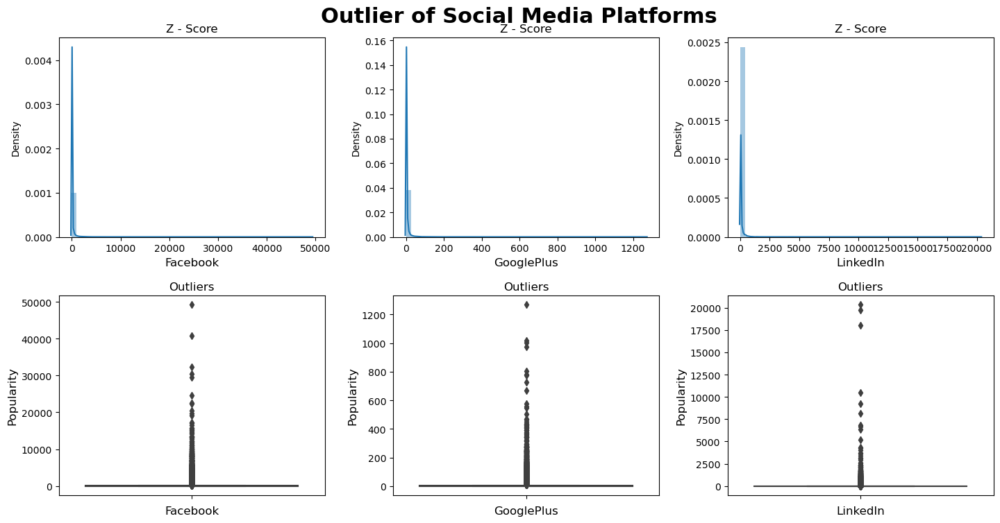

In [21]:
#Outlier Treatment
def show_outliers(df, three_d = False):
    fig, axes = plt.subplots(2,3,figsize=(15, 8))
    fig.tight_layout(pad=4.0)
    for source in range(len(sources)):
        sns.distplot(ax=axes[0][source],x=df[sources[source]])
        axes[0][source].set_xlabel(sources[source],fontdict={'fontsize': 12})
        axes[1][source].set_ylabel('Density',fontdict={'fontsize': 12})

        sns.boxplot(ax=axes[1][source],y=df[sources[source]] )
        axes[1][source].set_xlabel(sources[source],fontdict={'fontsize': 12})
        axes[1][source].set_ylabel('Popularity',fontdict={'fontsize': 12})

        axes[0][source].set_title('Z - Score')
        axes[1][source].set_title('Outliers')

        plt.suptitle('Outlier of Social Media Platforms',fontsize = 22,fontweight = 'bold')

    plt.show()

    if three_d == True:
        fig = px.scatter_3d(df, x='Facebook', y='GooglePlus', z='LinkedIn', title='Dependent Variables')
        fig.show()


show_outliers(master_df, True)

In [22]:
#treating the outliers by computing 90th percentile
def outliers_treatment(df, sources):
    for source in sources:
        ninetieth_percentile = np.percentile(df[source], 90)
        df[source] = np.where(df[source] > ninetieth_percentile, ninetieth_percentile, df[source])

    return df

master_df = outliers_treatment(master_df, sources)

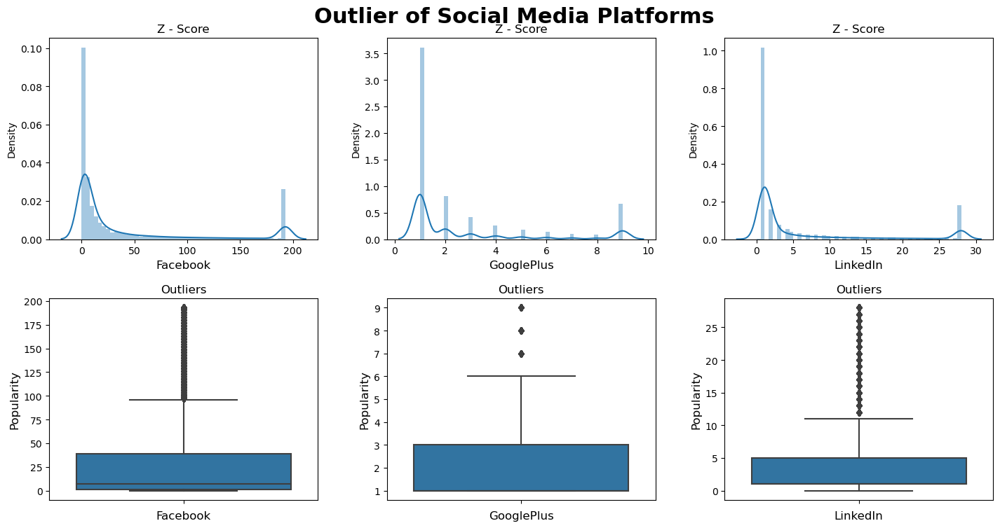

In [23]:
show_outliers(master_df, True)

In [24]:
# # Standard Scalar implementation
# #Standardize data
scaler = StandardScaler()

for source in sources:
    master = master_df[source].apply(lambda x:x if x!=(0) else np.nan)
    master_df[f'{source}_scaled'] = scaler.fit_transform(master.values.reshape(-1,1))

    master_df[f'{source}_scaled'].fillna(0,inplace=True)
    master_df[source].fillna(0,inplace=True)

In [25]:
# Using Logarithmic transformation
# import numpy as np

# for source in sources:
#     master = master_df[source].apply(lambda x: x if x != 0 else np.nan)  # We excluded level 0 because actually it's level -1, which we are not considering.
    
#     # Apply logarithmic transformation to non-zero values
#     master_df[f'{source}_scaled'] = master.apply(lambda x: np.log(x) if not np.isnan(x) else np.nan)

#     # Fill NaN values with 0
#     master_df[f'{source}_scaled'].fillna(0, inplace=True)
#     master_df[source].fillna(0, inplace=True)


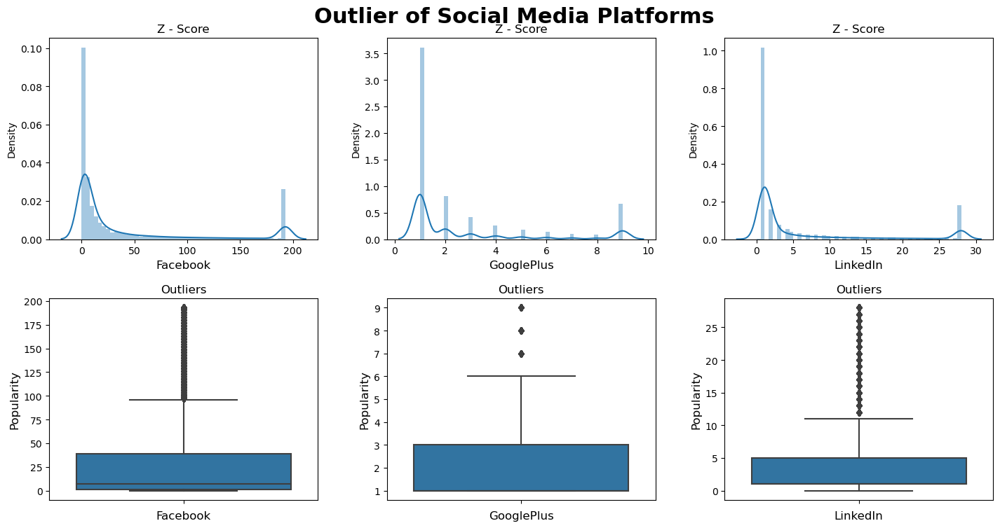

In [26]:
show_outliers(master_df, True)

In [27]:
master_df.reset_index(inplace=True, drop=True)
master_df.head(2)

,IDLink,Title,Headline,Source,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn,PublishTime,Weekday,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled
0,80690.0,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",bloomberg,palestine,2016-02-28,0.0,-0.005906,1.0,1.0,1.0,14:03:00,Sunday,-0.633726,-0.617774,-0.549169
1,81052.0,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,0.0,0.048546,1.0,1.0,1.0,09:29:00,Tuesday,-0.633726,-0.617774,-0.549169


In [28]:
#categorize sentiment features
master_df['SentimentTitle_Category'] = master_df['SentimentTitle'].apply(lambda x: 'neutral' if x == 0 else 'positive' if x > 0 else 'negative')

master_df['SentimentHeadline_Category'] = master_df['SentimentHeadline'].apply(lambda x: 'neutral' if x == 0 else 'positive' if x > 0 else 'negative')
master_df.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn,PublishTime,Weekday,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,SentimentTitle_Category,SentimentHeadline_Category
0,80690.0,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",bloomberg,palestine,2016-02-28,0.000000,-0.005906,1.0,1.0,1.0,14:03:00,Sunday,-0.633726,-0.617774,-0.549169,neutral,negative
1,81052.0,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,0.000000,0.048546,1.0,1.0,1.0,09:29:00,Tuesday,-0.633726,-0.617774,-0.549169,neutral,positive
2,80994.0,"Tuesday, 1 Mar 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",bloomberg,palestine,2016-03-01,-0.243068,0.048546,1.0,1.0,1.0,00:15:00,Tuesday,-0.633726,-0.617774,-0.549169,negative,positive
3,311.0,Microsoft offering £100 discount on original B...,Just ahead of the market rollout of Microsoft'...,international business times via yahoo uk & ir...,microsoft,2015-11-08,0.000000,-0.132812,1.0,1.0,1.0,05:25:00,Sunday,-0.633726,-0.617774,-0.549169,neutral,negative
4,252.0,Economy to improve though no change in last 6 ...,"&quot;In the coming six months, there seems to...",ians india private limited/yahoo india news vi...,economy,2015-11-08,-0.082022,0.205537,1.0,1.0,1.0,05:40:00,Sunday,-0.633726,-0.617774,-0.549169,negative,positive


In [29]:
def show_no_of_news_sentiment_title(df):
    print('******** No. of News items of SentimentTitle ********')
    print(df.SentimentTitle_Category.value_counts(),'\n')

    plt.figure(figsize=(10,8))
    df.SentimentTitle_Category.value_counts().plot(kind='bar')
    plt.title('News Items Distribution of Each Sentiment Title', fontdict={'size':20, 'fontweight' : 'bold'})
    plt.xlabel('Sentiment Type',fontdict={'size':15})
    plt.ylabel('No. of News Items',fontdict={'size':15})

def show_no_of_news_sentiment_headline(df):
    print('******** No. of News items of SentimentHeadline ********')
    print(df.SentimentHeadline_Category.value_counts(),'\n')

    plt.figure(figsize=(10,8))
    df.SentimentHeadline_Category.value_counts().plot(kind='bar')
    plt.title('News Items Distribution of Each Sentiment Headline', fontdict={'size':20, 'fontweight' : 'bold'})
    plt.xlabel('Sentiment Type',fontdict={'size':15})
    plt.ylabel('No. of News Items',fontdict={'size':15})

******** No. of News items of SentimentTitle ********
negative    35484
positive    34377
neutral     17617
Name: SentimentTitle_Category, dtype: int64 



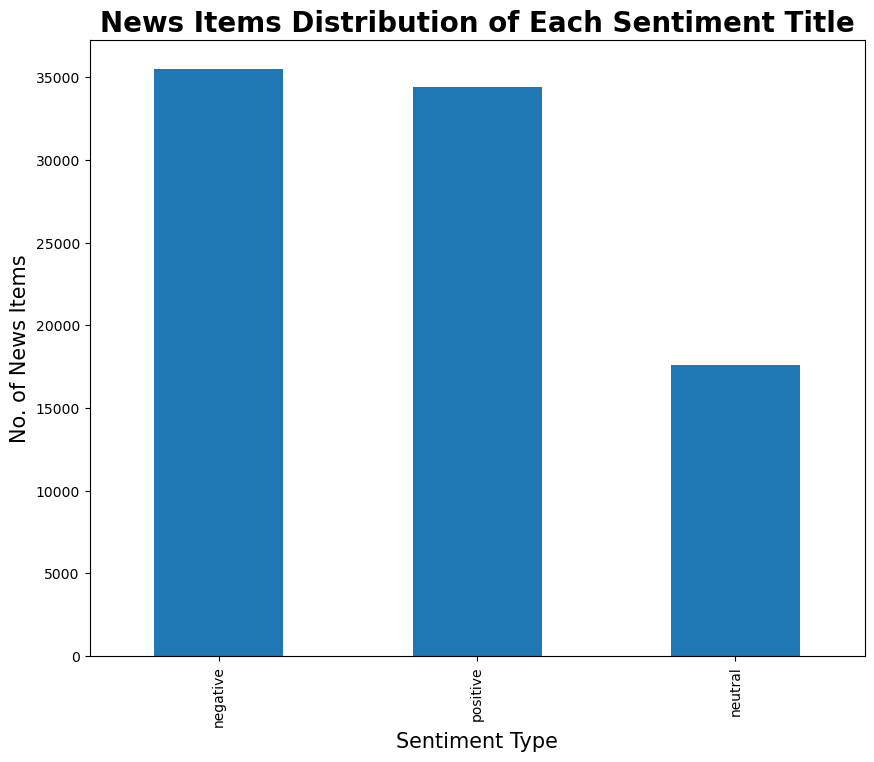

In [30]:
show_no_of_news_sentiment_title(master_df)

******** No. of News items of SentimentHeadline ********
negative    49452
positive    35328
neutral      2698
Name: SentimentHeadline_Category, dtype: int64 



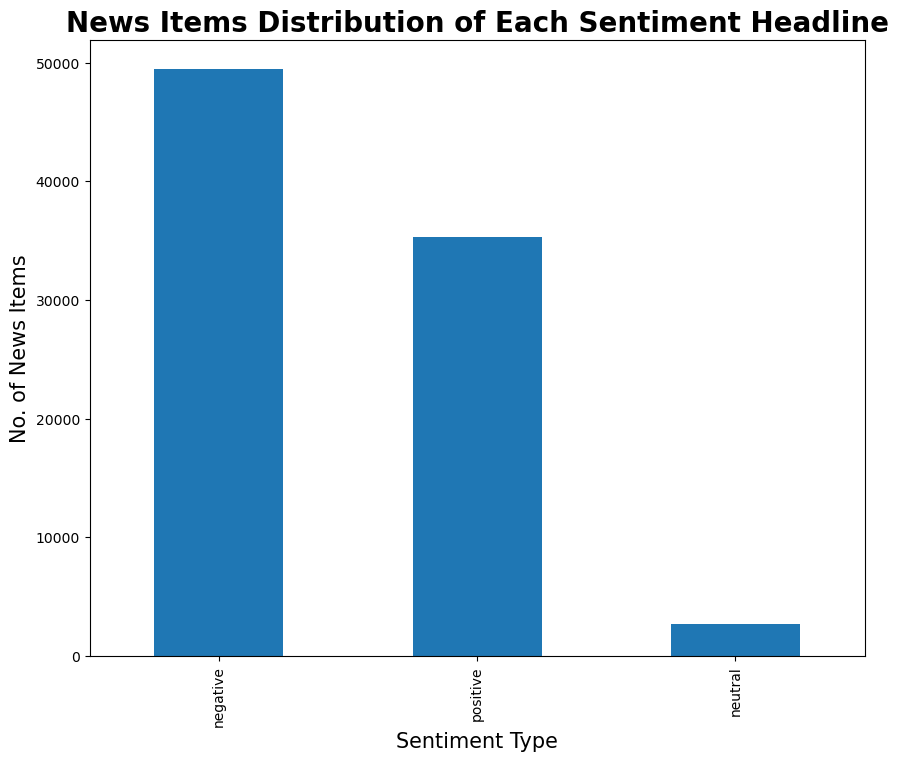

In [31]:
show_no_of_news_sentiment_headline(master_df)

In [32]:
q1 = np.percentile(master_df['Source'].value_counts().unique(), 25, interpolation = 'midpoint')
q2 = np.percentile(master_df['Source'].value_counts().unique(), 50, interpolation = 'midpoint')
q3 = np.percentile(master_df['Source'].value_counts().unique(), 75, interpolation = 'midpoint')
print('----- Quaters -----')
print('> q1: ',q1,'\n> q2:',q2,'\n> q3:',q3)


source_df = pd.DataFrame(master_df['Source'].value_counts())
master_df['Source_type'] = master_df['Source'].apply(lambda x: 'A' if source_df['Source'][x]<=q1 else 'B'
                                                     if source_df['Source'][x]<=q2 else 'C' if source_df['Source'][x]<=q3 else 'D')
master_df.drop(columns=['Source'], inplace = True)

----- Quaters -----
> q1:  57.0 
> q2: 124.0 
> q3: 261.0


******** No. of News items in Sources ********
A    31866
D    28934
C    14436
B    12242
Name: Source_type, dtype: int64 



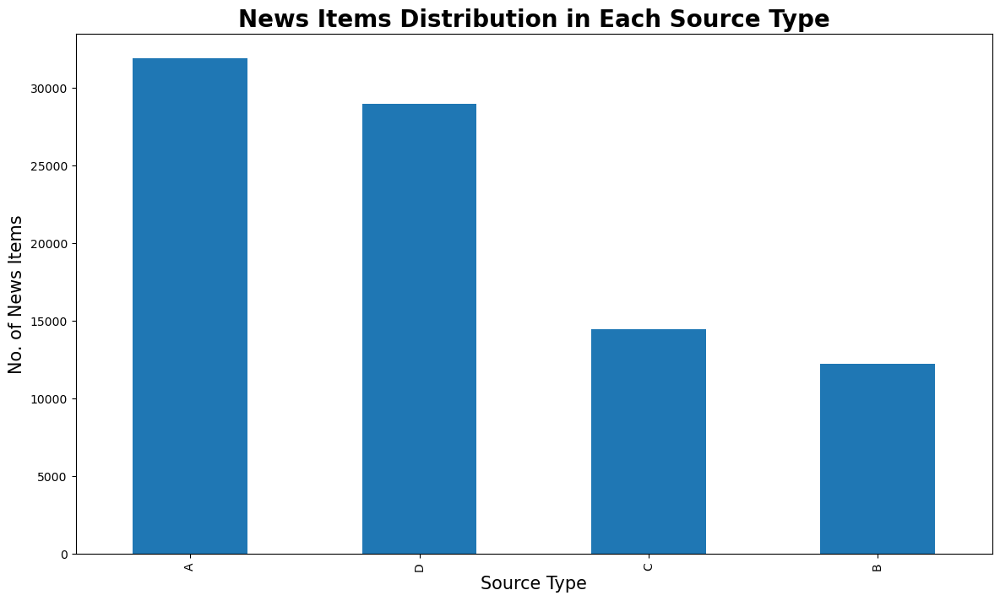

In [33]:
def show_news_distribution_in_sources(df):
    print('******** No. of News items in Sources ********')
    print(df.Source_type.value_counts(),'\n')

    plt.figure(figsize=(14,8))
    df.Source_type.value_counts().plot(kind='bar')
    plt.title('News Items Distribution in Each Source Type', fontdict={'size':20,'fontweight' : 'bold'})
    plt.xlabel('Source Type',fontdict={'size':15})
    plt.ylabel('No. of News Items',fontdict={'size':15})

show_news_distribution_in_sources(master_df)

In [34]:
def mean_cal(data):
    count = len(data)-data.count(0) # because level 0 means, the news item hasn't landed on the platform yet.
    if count==0:
        return 0
    avg = (sum(data))/count

    return avg

rows = df['Facebook_Economy'].loc[:,'TS1':].columns

def mean_news_popularity(df_dict, social_media, rows):
    mean_df = pd.DataFrame(index = rows, columns = ['Economy','Microsoft','Obama','Palestine'])
    mean_df['Economy'] = df_dict[f'{social_media}_Economy'].apply(lambda x: mean_cal(list(x)))
    mean_df['Microsoft'] = df_dict[f'{social_media}_Microsoft'].apply(lambda x: mean_cal(list(x)))
    mean_df['Obama'] = df_dict[f'{social_media}_Obama'].apply(lambda x: mean_cal(list(x)))
    mean_df['Palestine'] = df_dict[f'{social_media}_Palestine'].apply(lambda x: mean_cal(list(x)))

    return mean_df




In [35]:
def mean_suitable_platform(df_dict, topic, rows):
    mean_df = pd.DataFrame(index=rows, columns = ['LinkedIn','GooglePlus','Facebook'])
    mean_df['LinkedIn'] = df_dict[f'LinkedIn_{topic}'].apply(lambda x: mean_cal(list(x)))
    mean_df['GooglePlus'] = df_dict[f'GooglePlus_{topic}'].apply(lambda x: mean_cal(list(x)))
    mean_df['Facebook'] = df_dict[f'Facebook_{topic}'].apply(lambda x: mean_cal(list(x)))

    return mean_df




In [36]:
def mean_source_popularity(df, df_dict, platform, rows):
    source_a_df, source_b_df, source_c_df, source_d_df = df[df['Source_type'] == 'A'],df[df['Source_type'] == 'B'],df[df['Source_type'] == 'C'],df[df['Source_type'] == 'D']
    
    platform_df = df_dict[f'{platform}_Economy'].append(df_dict[f'{platform}_Microsoft'].append(df_dict[f'{platform}_Obama'].append(df_dict[f'{platform}_Palestine'])))

    pt_sa = source_a_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')
    pt_sb = source_b_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')
    pt_sc = source_c_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')
    pt_sd = source_d_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')

    pt_sa = pt_sa.loc[:,'TS1':]
    pt_sb = pt_sb.loc[:,'TS1':]
    pt_sc = pt_sc.loc[:,'TS1':]
    pt_sd = pt_sd.loc[:,'TS1':]


    mean_df = pd.DataFrame(index=rows, columns = ['Source_A','Source_B','Source_C', 'Source_D'])
    mean_df.Source_A = pt_sa.apply(lambda x: mean_cal(list(x)))
    mean_df.Source_B = pt_sb.apply(lambda x: mean_cal(list(x)))
    mean_df.Source_C = pt_sc.apply(lambda x: mean_cal(list(x)))
    mean_df.Source_D = pt_sd.apply(lambda x: mean_cal(list(x)))

    return mean_df





In [37]:
def seperate_news_for_topic(df):

    obama_news = df[df['Topic'] == 'obama']
    microsoft_news = df[df['Topic'] == 'microsoft']
    economy_news = df[df['Topic'] == 'economy']
    palestine_news = df[df['Topic'] == 'palestine']

    return (obama_news, microsoft_news, economy_news, palestine_news)

topic_tuple = seperate_news_for_topic(master_df)
obama_news = topic_tuple[0]
microsoft_news = topic_tuple[1]
economy_news = topic_tuple[2]
palestine_news = topic_tuple[3]

In [38]:
def get_master_tsdf_min_after_pub(df, tsdf_name):
    # df['SOP'] = df.apply(lambda x:  sum([a for a in x[1:] if a>0]), axis = 1)

    social_med = tsdf_name.split('_')[0]
    columns_to_delete = df.columns[1:-1]
    tsdf_sum_fb = df.drop(columns=columns_to_delete)
    
    merge_master_tsdf_sum_fb = pd.merge(master_df[['IDLink','Topic','PublishDate', 'PublishTime', social_med]], tsdf_sum_fb, on ='IDLink')

    df['AppearedAfterMinutes'] = df.apply(lambda x:  sum([20 for a in x[1:] if a==0]), axis = 1)
    tsdf_map_fb = df.drop(columns=columns_to_delete)

    merge_master_tsdf_map_fb = pd.merge(master_df[['IDLink','Topic','PublishDate', 'PublishTime', social_med]], tsdf_map_fb, on ='IDLink')
    # merge_master_tsdf_map_fb = merge_master_tsdf_map_fb[merge_master_tsdf_map_fb[social_med] != -1]

    merge_master_tsdf_map_fb['PublishHour'] = merge_master_tsdf_map_fb['PublishTime'].apply(lambda x: str(x)[0:2])
    merge_master_tsdf_map_fb=merge_master_tsdf_map_fb.sort_values(by='PublishHour')
    return merge_master_tsdf_map_fb



In [40]:
 def senti_mean(df, df_dict, platform, rows):
    senti_p_df, senti_neu_df, senti_n_df = df[df['SentimentTitle_Category'] == 'positive'],df[df['SentimentTitle_Category'] == 'neutral'],df[df['SentimentTitle_Category'] == 'negative']
    platform_df = df_dict[f'{platform}_Economy'].append(df_dict[f'{platform}_Microsoft'].append(df_dict[f'{platform}_Obama'].append(df_dict[f'{platform}_Palestine'])))

    spos = senti_p_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')
    sneu = senti_neu_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')
    sneg = senti_n_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')

    spos = spos.loc[:,'TS1':]
    sneu = sneu.loc[:,'TS1':]
    sneg = sneg.loc[:,'TS1':]


    senti_mean_df = pd.DataFrame(index=rows, columns = ['Positive','Neutral','Negative'])
    senti_mean_df.Positive = spos.apply(lambda x: mean_cal(list(x)))
    senti_mean_df.Neutral = sneu.apply(lambda x: mean_cal(list(x)))
    senti_mean_df.Negative = sneg.apply(lambda x: mean_cal(list(x)))

    return senti_mean_df

def show_sentiment_popularity_trend(df, df_dict, platform, rows):
    sns.set(rc={'figure.figsize':(25,7)})
    sns.lineplot(data = senti_mean(df, df_dict, platform, rows), dashes=False)
    plt.title(f'Sentiment-wise Popularity on {platform}',fontdict={'size':20, 'fontweight' : 'bold'})
    plt.xlabel('Time',fontdict={'size':15})
    plt.ylabel('Popularity',fontdict={'size':15})

def show_sentiment_popularity_comparison(df, df_dict, platform, rows):

    fig, axes = plt.subplots(1, 2, sharex=True, figsize=(20,8))
    df1 = senti_mean(df, df_dict, platform, rows)
    plt.suptitle(f'Popularity Comparison on {platform}',fontsize = 22, fontweight = 'bold')
    sns.barplot(ax = axes[0],data = df1)
    sns.boxenplot(ax = axes[1],data = df1)
    axes[0].set_ylabel('Popularity', fontsize = 15)
    axes[0].set_xlabel('Sentiment', fontsize = 15)
    axes[1].set_ylabel('Popularity', fontsize = 15)
    axes[1].set_xlabel('Sentiment', fontsize = 15)


In [41]:
 def senti_mean(df, df_dict, platform, rows):
    senti_p_df, senti_neu_df, senti_n_df = df[df['SentimentTitle_Category'] == 'positive'],df[df['SentimentTitle_Category'] == 'neutral'],df[df['SentimentTitle_Category'] == 'negative']
    platform_df = df_dict[f'{platform}_Economy'].append(df_dict[f'{platform}_Microsoft'].append(df_dict[f'{platform}_Obama'].append(df_dict[f'{platform}_Palestine'])))

    spos = senti_p_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')
    sneu = senti_neu_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')
    sneg = senti_n_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')

    spos = spos.loc[:,'TS1':]
    sneu = sneu.loc[:,'TS1':]
    sneg = sneg.loc[:,'TS1':]


    senti_mean_df = pd.DataFrame(index=rows, columns = ['Positive','Neutral','Negative'])
    senti_mean_df.Positive = spos.apply(lambda x: mean_cal(list(x)))
    senti_mean_df.Neutral = sneu.apply(lambda x: mean_cal(list(x)))
    senti_mean_df.Negative = sneg.apply(lambda x: mean_cal(list(x)))

    return senti_mean_df




In [42]:
def show_popularities(df, sentiment):
    platform_df = df[['Facebook_scaled', 'GooglePlus_scaled','LinkedIn_scaled']]
    platform_df = abs(platform_df)
    platform_df[f'{sentiment}_Category'] = df[f'{sentiment}_Category']
    temp_df = pd.DataFrame(columns = ['Facebook','GooglePlus','LinkedIn'])
    temp_df['Facebook'] = platform_df.groupby([f'{sentiment}_Category'])['Facebook_scaled'].sum()
    temp_df['GooglePlus'] = platform_df.groupby([f'{sentiment}_Category'])['GooglePlus_scaled'].sum()
    temp_df['LinkedIn'] = platform_df.groupby([f'{sentiment}_Category'])['LinkedIn_scaled'].sum()
    
    
    bars=temp_df.columns

    fig = go.Figure(data=[
        go.Bar(name='Negative', x=bars, y=temp_df['Facebook']),
        go.Bar(name='Neutral', x=bars, y=temp_df['GooglePlus']),
        go.Bar(name='Positive', x=bars, y=temp_df['LinkedIn'])
    ])
    # Change the bar mode
    fig.update_layout(barmode='group',title_text='Sentiment Distribution')
    fig.show()


In [43]:
def weekday_distribution(df):
    df1 = df[['Facebook','LinkedIn','GooglePlus','Weekday']]
    temp_df = pd.DataFrame([df1.groupby(['Weekday'])['Facebook'].mean(),df1.groupby(['Weekday'])['LinkedIn'].mean(),df1.groupby(['Weekday'])['GooglePlus'].mean()])

    fig, axes = plt.subplots(1, 3, sharex=True, figsize=(25,7))
    fig.suptitle('News Popularity Distribution Weekdays', fontsize=22,fontweight='bold')
    temp_df.T['Facebook'].plot(ax = axes[0],kind='bar', color= 'grey', title='Facebook', ylabel='Popularity')
    temp_df.T['GooglePlus'].plot(ax = axes[1],kind='bar', color= 'lightgreen',title='GooglePlus',ylabel='Popularity')
    temp_df.T['LinkedIn'].plot(ax = axes[2],kind='bar', color= 'red', title='LinkedIn',ylabel='Popularity')
    axes[0].set_xlabel('Weekday', fontsize = 15)
    axes[0].set_ylabel('Popularity', fontsize = 15)
    axes[1].set_xlabel('Weekday', fontsize = 15)
    axes[1].set_ylabel('Popularity', fontsize = 15)
    axes[2].set_xlabel('Weekday', fontsize = 15)
    axes[2].set_ylabel('Popularity', fontsize = 15)

In [44]:
def work_with_time_and_date(df):
    # Changing time in Seconds
    df['PublishTime'] = df.PublishTime.apply(lambda x: (x.hour * 60 + x.minute) * 60 + x.second)
    seconds_in_day = 24*60*60

    # Making Time Cyclic
    df['PublishSinTime'] = df['PublishTime'].apply(lambda x: np.sin(2*np.pi*x/seconds_in_day))
    df['PublishCosTime'] = df['PublishTime'].apply(lambda x: np.cos(2*np.pi*x/seconds_in_day))
    df['Hour'] = df['PublishTime'].apply(lambda x: str(x)[0:2])
    df.drop(columns='PublishTime',inplace=True)

    # Categorizing Months
    df['PublishMonth'] = master_df['PublishDate'].apply(lambda x: calendar.month_name[x.month])

    return df


In [45]:
def show_month_distribution(df):
    fig, axes = plt.subplots(1, 3, figsize=(25,7))
    fig.suptitle('News Popularity Distribution Month-wise ', fontsize=20, fontweight = 'bold')

    sns.barplot(ax = axes[0],x='PublishMonth',y='Facebook',data = master_df)
    sns.barplot(ax = axes[1],x='PublishMonth',y='GooglePlus',data = master_df)
    sns.barplot(ax = axes[2], x='PublishMonth',y='LinkedIn',data = master_df)
    
    for i in range(3):
        axes[i].tick_params(labelrotation=45)
        axes[i].set_ylabel('Popularity', fontsize = 15)

    axes[0].set_xlabel('Facebook', fontsize = 15)
    axes[1].set_xlabel('GooglePlus', fontsize = 15)
    axes[2].set_xlabel('LinkedIn', fontsize = 15)

In [46]:
# Merge all the 12 Time Series Dataframe with master_df

def change_df(df, n, col_name_prefix):
    df['TS0'] = 0
    new_df = df[['IDLink']]
    for i,j in zip(range(1,(72//n)+1), range(n, 73, n)):
        new_df[f'{col_name_prefix}_t{i}'] = df[f'TS{j}'] - df[f'TS{j-n}']

    return new_df

def merge_df(fb_df, gp_df, li_df, topic):
    # Convert the dataframe into - "popularity in every 6 hours"
    # 3*k: 3 -> TS1+TS2+TS3 = 1 hour, k -> hours
    new_fb_df = change_df(fb_df, 3*6, 'fb')
    new_gp_df = change_df(gp_df, 3*6, 'gp')
    new_li_df = change_df(li_df, 3*6, 'li')

    new_final_df = new_fb_df.merge(new_gp_df.merge(new_li_df, on = 'IDLink', how='outer'), on = 'IDLink', how='outer')

    return new_final_df


def merge_all_df(master_df, df):

    # Step 1: Split master_df into Topics: Economy, Microsoft, Obama, Palestine
    economy_df, microsoft_df, obama_df, palestine_df = master_df[master_df.Topic == 'economy'], master_df[master_df.Topic == 'microsoft'], master_df[master_df.Topic == 'obama'], master_df[master_df.Topic == 'palestine']

    # Step 2: Combine all Topics dataframes: like: (Facebook_Economy, LinkedIn_Economy, GooglePlus_Economy), (Facebook_Obama, GooglePlus_Obama, LinkedIn_Obama), etc.
    df_time_dict = {}
    for topic in ['Economy','Microsoft','Obama','Palestine']:
        df_time_dict[topic] = merge_df(df[f'Facebook_{topic}'], df[f'GooglePlus_{topic}'], df[f'LinkedIn_{topic}'], topic )

    # Step 3: Merge splitted master_df dataframe and df_time_dict dataframes
    economy_df = economy_df.merge(df_time_dict['Economy'], on='IDLink',how = 'left')
    microsoft_df = microsoft_df.merge(df_time_dict['Microsoft'], on='IDLink',how = 'left')
    obama_df = obama_df.merge(df_time_dict['Obama'], on='IDLink',how = 'left')
    palestine_df = palestine_df.merge(df_time_dict['Palestine'], on='IDLink',how = 'left')

    # Step 4: Append all the dataframes to make the final master dataframe
    final_master_df = economy_df.append(microsoft_df.append(obama_df.append(palestine_df)))

    # Removing Null values
    print('Before: ',list(final_master_df.isna().sum()))

    # Checking for the news who has some popularity on any social media and it's time series columns are null
    temp = final_master_df[final_master_df.isnull().any(axis=1)]
    null_indexes = temp[temp['Facebook'] != 1].index
    for ind in null_indexes:
        final_master_df['fb_t1'][ind] = 1  # Popularity of those news after 2 days is 1. So, at some point in time, the popularity difference would be one.

    final_master_df.fillna(0, inplace=True)
    print('After: ',list(final_master_df.isna().sum()))

    return final_master_df


In [47]:
#Tf-idf vectorizer

# def cols_to_remove(df):
#     cols = []
#     for col in df.columns:
#         try:
#             int(col)
#             cols.append(col)
#         except:
#             continue

#     return cols


# def title_headline_processing():
#     st = PorterStemmer()
#     master_df['title_headline'] = master_df['Title']+', '+master_df['Headline']
#     master_df['title_headline'] = master_df['title_headline'].apply(lambda x: " ".join([st.stem(word) for word in x.split()]))
#     master_df['title_headline'] = master_df['title_headline'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))

#     tfidfvectorizer = TfidfVectorizer(analyzer='word', stop_words='english', max_df=0.7, min_df = 150, max_features = 1000)
#     tfidf_wm = tfidfvectorizer.fit_transform(master_df['title_headline'])
#     tfidf_tokens = tfidfvectorizer.get_feature_names_out()
#     df_tfidfvect = pd.DataFrame(data = tfidf_wm.toarray(), columns=tfidf_tokens)
#     df_tfidfvect['IDLink'] = master_df['IDLink'].reset_index(drop=True).copy()

#     trash_cols = cols_to_remove(df_tfidfvect)

#     # Removing all the numeric columns
#     df_tfidfvect.drop(columns=trash_cols, inplace=True)

#     return df_tfidfvect

In [48]:

#Word To Vectorizer

from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import nltk
import multiprocessing
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Add this import for Word2Vec
from gensim.models import Word2Vec

def cols_to_remove(df):
    cols = []
    for col in df.columns:
        try:
            int(col)
            cols.append(col)
        except:
            continue
    return cols

def title_headline_processing(): 
    st = PorterStemmer()
    lem = WordNetLemmatizer()

    # Assuming you have a DataFrame named master_df with 'Title' and 'Headline' columns
    # For this example, we will create a new 'title_headline' column by combining 'Title' and 'Headline'
    master_df['title_headline'] = master_df['Title'] + ', ' + master_df['Headline']

    # Tokenize and preprocess text
    master_df['title_headline'] = master_df['title_headline'].apply(lambda x: nltk.word_tokenize(x.lower()))
    master_df['title_headline'] = master_df['title_headline'].apply(lambda x: [word for word in x if word.isalpha()])
    master_df['title_headline'] = master_df['title_headline'].apply(lambda x: [st.stem(word) for word in x])
    master_df['title_headline'] = master_df['title_headline'].apply(lambda x: [lem.lemmatize(word) for word in x])

    # Convert the processed text into a list of sentences
    sentences = master_df['title_headline'].tolist()

    # Train Word2Vec model
    vector_size = 100  # Set the size of the word embeddings
    window = 10  # Set the context window size for training
    min_count = 1  # Set the minimum word frequency to include in the vocabulary
    workers = multiprocessing.cpu_count()  # Set the number of CPU cores to use for training (change it based on your system)

    model = Word2Vec(sentences=sentences, vector_size=vector_size, window=window, min_count=min_count, workers=workers)
    
    

    # Create a new DataFrame with word embeddings
    embeddings_df = pd.DataFrame([model.wv[word] for sentence in sentences for word in sentence])
    # Combine all columns into a single list column
    #embeddings_df['title_headline_embeddings'] = embeddings_df.apply(lambda row: row.tolist(), axis=1)
    
    # Drop the remaining columns
    #embeddings_df.drop(embeddings_df.columns.difference(['title_headline_embeddings']), axis=1, inplace=True)

    # Concatenate the 'IDLink' column to the embeddings DataFrame
    embeddings_df['IDLink'] = master_df['IDLink'].reset_index(drop=True)
    
    

    return embeddings_df

[nltk_data] Downloading package punkt to C:\Users\Dhananjeyan M
[nltk_data]     S\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\Dhananjeyan M
[nltk_data]     S\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\Dhananjeyan M
[nltk_data]     S\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [49]:
# Calculate tiltle word length and headline word length

def add_doc_length():
    countVecorizer = CountVectorizer(analyzer = 'word', stop_words = 'english', max_df=0.7, min_df = 150)
    count_wm_title = countVecorizer.fit_transform(master_df['Title'])

    count_tokens_title = countVecorizer.get_feature_names_out()
    df1 = pd.DataFrame(data = count_wm_title.toarray(),columns = count_tokens_title)

    count_wm_headline = countVecorizer.fit_transform(master_df['Headline'])
    count_tokens_headline = countVecorizer.get_feature_names_out()
    df2 = pd.DataFrame(data = count_wm_headline.toarray(),columns = count_tokens_headline)
    master_df['Title_wl'] = df1.sum(axis = 1)
    master_df['Headline_wl'] = df2.sum(axis = 1)

def show_doc_length_desity_plot(df):
    fig, axes = plt.subplots(1, 2, figsize=(25,7))

    sns.distplot(df['Title_wl'], ax= axes[0], color='brown')
    axes[0].set_title('Title',fontdict={'fontsize': '15', 'fontweight' : 'bold'})
    axes[0].set_xlabel('Title Word Length', fontsize = 15)
    axes[0].set_ylabel('Density', fontsize = 15)

    sns.distplot(df['Headline_wl'],ax= axes[1], color='black')
    axes[1].set_title('Headline',fontdict={'fontsize': '15', 'fontweight' : 'bold'})
    axes[1].set_xlabel('Headline Word Length', fontsize = 15)
    axes[1].set_ylabel('Density', fontsize = 15)

    fig.suptitle('Title And Headline Document Length Distribution', fontsize = 22, fontweight = 'bold')

In [50]:
def show_doc_length_relation_with_popularity(df):
    fig, axes = plt.subplots(3, 2, figsize=(25,25))

    sns.scatterplot(ax= axes[0][0],data = df, x = 'Title_wl', y='Facebook_scaled', color='green')
    axes[0][0].set_title('Title on Facebook',fontdict={'fontsize': '18', 'fontweight' : 'bold'})

    sns.scatterplot(ax= axes[0][1],data = df, x = 'Headline_wl', y='Facebook_scaled', color='green')
    axes[0][1].set_title('Headline on Facebook',fontdict={'fontsize': '18', 'fontweight' : 'bold'})


    sns.scatterplot(ax= axes[1][0],data = df, x = 'Title_wl', y='GooglePlus_scaled', color='red')
    axes[1][0].set_title('Title on GooglePlus',fontdict={'fontsize': '18', 'fontweight' : 'bold'})


    sns.scatterplot(ax= axes[1][1],data = df, x = 'Headline_wl', y='GooglePlus_scaled', color='red')
    axes[1][1].set_title('Headline on GooglePlus',fontdict={'fontsize': '18', 'fontweight' : 'bold'})


    sns.scatterplot(ax= axes[2][0],data = df, x = 'Title_wl', y='LinkedIn_scaled', color='blue')
    axes[2][0].set_title('Title on LinkedIn',fontdict={'fontsize': '18', 'fontweight' : 'bold'})

    sns.scatterplot(ax= axes[2][1],data = df, x = 'Headline_wl', y='LinkedIn_scaled', color='blue')
    axes[2][1].set_title('Headline on LinkedIn',fontdict={'fontsize': '18', 'fontweight' : 'bold'})

    fig.suptitle('Effect Of Title And Headline Length On Popularity', fontsize = 22, fontweight = 'bold')

    for i in range(0,3):
        for j in range(0,2):
            if j==1:
                axes[i][j].set_xlabel('Headline Word Length', fontsize = 15)
            else:
                axes[i][j].set_xlabel('Title Word Length', fontsize = 15)
            axes[i][j].set_ylabel('Popularity', fontsize = 15)


In [51]:
Platform = "GooglePlus" #@param ["Facebook", "GooglePlus", "LinkedIn"]

In [52]:
Topic = "Economy" #@param ["Economy", "Microsoft", "Obama","Palestine"]

In [54]:
Start_Date = '2015-12-12'
End_Date = '2016-02-12' 

In [55]:
Platform_Topic = "LinkedIn_Economy" 

In [58]:
# plot_hour_vs_popularity(master_df,Platform)
master_df['Hour'] = master_df['PublishTime'].apply(lambda x: str(x)[0:2])
master_df=master_df.sort_values(by='Hour')

In [59]:
Sentiment_Type = "SentimentTitle" #@param ["SentimentHeadline", "SentimentTitle"]

In [63]:
show_popularities(master_df, Sentiment_Type)

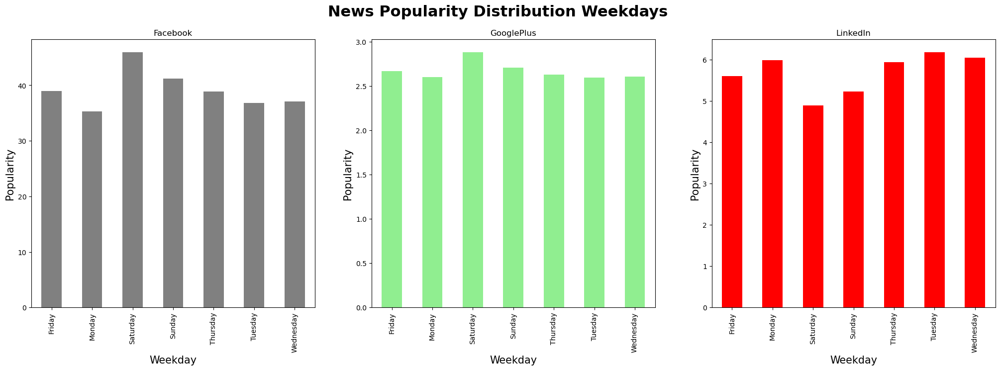

In [64]:
weekday_distribution(master_df)

In [65]:
master_df = work_with_time_and_date(master_df.copy())

def show_time(df):
    # Include Cyclic Time
    df[['PublishSinTime','PublishCosTime']].sample(100).plot.scatter('PublishSinTime','PublishCosTime', c='blue').set_aspect('equal')
    plt.xlabel('PublishSinTime',fontsize = 15)
    plt.ylabel('PublishCosTime',fontsize = 15)
    plt.title('Clock',fontdict={'fontsize': 22, 'fontweight' : 'bold'})



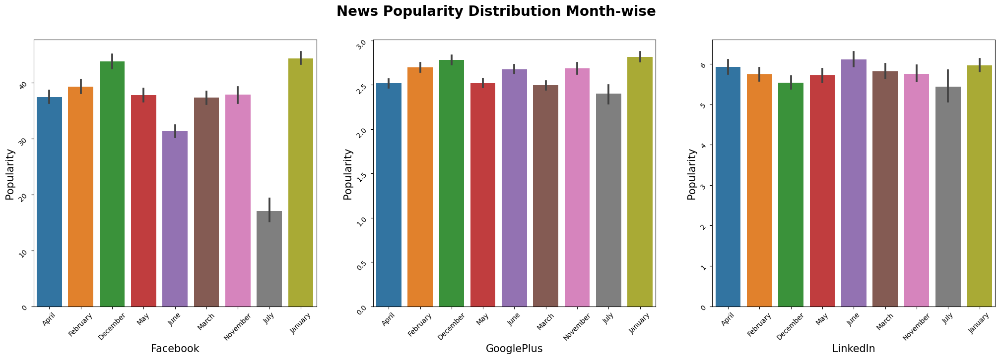

In [66]:
show_month_distribution(master_df)

Before:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5317, 5317, 5317, 5317, 0, 0, 0, 0, 0, 0, 0, 0]
After:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


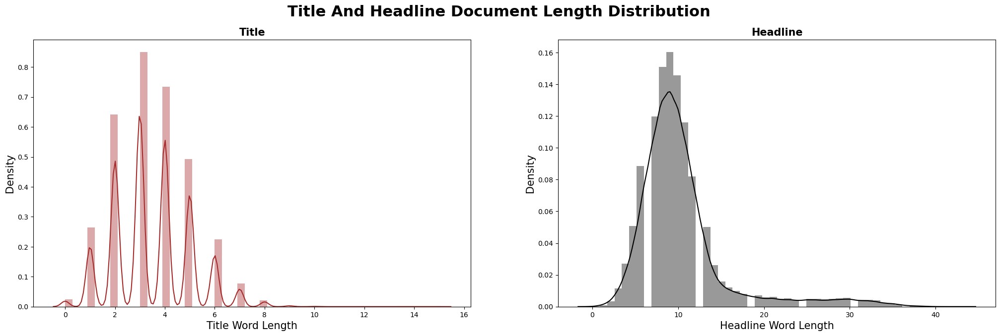

In [67]:
# Merging all the DataFrames and text preprocessing
master_df = merge_all_df(master_df.copy(), df.copy())
tfidfvect_df = title_headline_processing()

# Adding title and headline word length to the master DataFrame
add_doc_length()
show_doc_length_desity_plot(master_df)

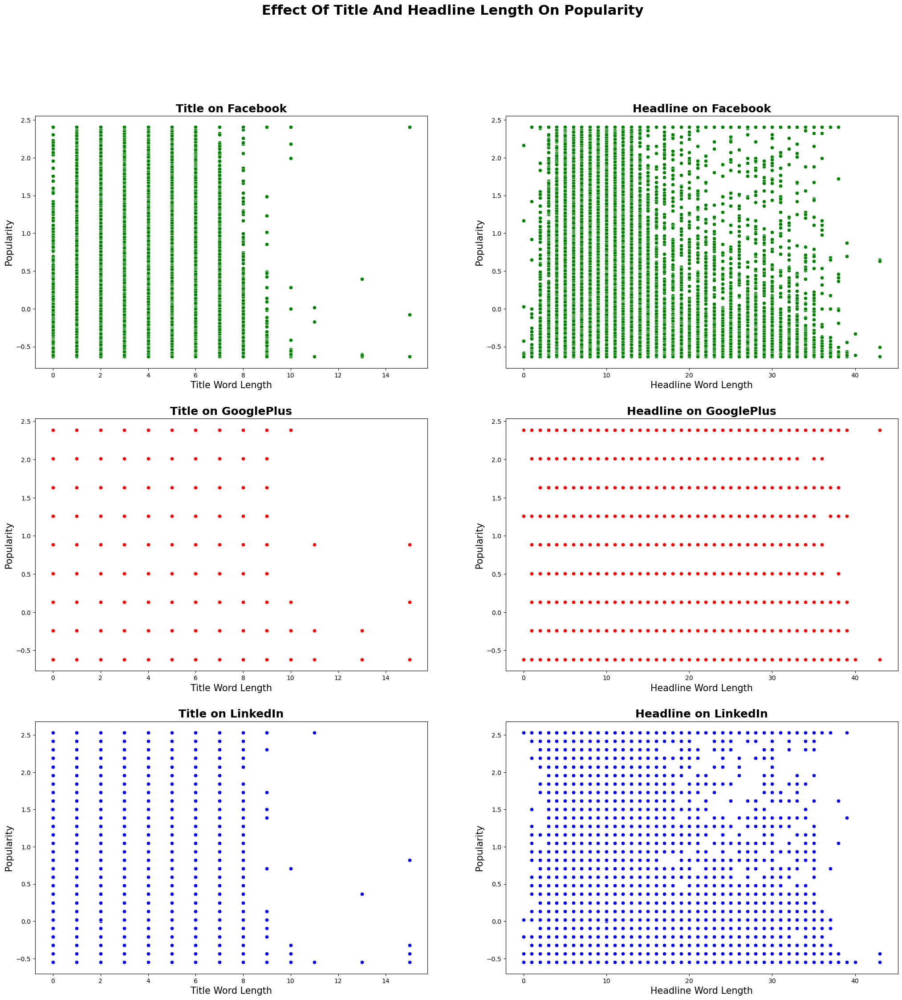

In [68]:
show_doc_length_relation_with_popularity(master_df)

In [69]:
#Using Sentiment Headline and title as one hot encoding

# Scaling Title_wl and Headline_wl
master_df['Title_wl'] = scaler.fit_transform(master_df.Title_wl.values.reshape(-1,1))
master_df['Headline_wl'] = scaler.fit_transform(master_df.Headline_wl.values.reshape(-1,1))


# Merging TfidfVectorized dataframe and master_df
master_df = master_df.merge(tfidfvect_df, on='IDLink', how = 'left')

irrelevant_columns = ['IDLink', 'Title', 'Headline', 'PublishDate', 'Facebook','GooglePlus',
                      'LinkedIn', 'Hour','title_headline', 'SentimentTitle_Category', 'SentimentHeadline_Category']

# Dropping irrelevant columns, i.e. other than
master_df.drop(columns = irrelevant_columns, inplace = True)




master_df = pd.get_dummies(master_df, columns=['Topic','Source_type','PublishMonth','Weekday'])

print(master_df.shape)
master_df.head()

(87478, 145)


,SentimentTitle,SentimentHeadline,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,PublishSinTime,PublishCosTime,fb_t1,fb_t2,fb_t3,...,PublishMonth_March,PublishMonth_May,PublishMonth_November,Weekday_Friday,Weekday_Monday,Weekday_Saturday,Weekday_Sunday,Weekday_Thursday,Weekday_Tuesday,Weekday_Wednesday
0,0.037326,-0.158388,-0.127447,-0.242206,0.362975,0.153920,0.988083,14.0,1.0,2.0,...,0,0,0,0,1,0,0,0,0,0
1,-0.083333,-0.117899,-0.633726,0.133362,-0.549169,0.175438,0.984490,1.0,0.0,0.0,...,0,0,0,0,1,0,0,0,0,0
2,-0.083333,-0.215187,-0.586262,-0.617774,-0.549169,0.175582,0.984465,1.0,0.0,0.0,...,0,0,0,0,1,0,0,0,0,0
3,0.088388,0.237582,-0.554619,-0.242206,-0.207115,0.205279,0.978703,3.0,2.0,0.0,...,0,0,0,0,1,0,0,0,0,0
4,-0.088388,-0.312250,2.403948,0.133362,-0.549169,0.209832,0.977737,69.0,107.0,30.0,...,0,0,0,0,1,0,0,0,0,0


In [70]:
#Shuffle the dataset

import pandas as pd
import numpy as np


# Add a new column with random numbers
master_df['Random_Numbers'] = np.random.rand(len(master_df))

master_df.head()


,SentimentTitle,SentimentHeadline,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,PublishSinTime,PublishCosTime,fb_t1,fb_t2,fb_t3,...,PublishMonth_May,PublishMonth_November,Weekday_Friday,Weekday_Monday,Weekday_Saturday,Weekday_Sunday,Weekday_Thursday,Weekday_Tuesday,Weekday_Wednesday,Random_Numbers
0,0.037326,-0.158388,-0.127447,-0.242206,0.362975,0.153920,0.988083,14.0,1.0,2.0,...,0,0,0,1,0,0,0,0,0,0.917859
1,-0.083333,-0.117899,-0.633726,0.133362,-0.549169,0.175438,0.984490,1.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0.593636
2,-0.083333,-0.215187,-0.586262,-0.617774,-0.549169,0.175582,0.984465,1.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0.488934
3,0.088388,0.237582,-0.554619,-0.242206,-0.207115,0.205279,0.978703,3.0,2.0,0.0,...,0,0,0,1,0,0,0,0,0,0.185528
4,-0.088388,-0.312250,2.403948,0.133362,-0.549169,0.209832,0.977737,69.0,107.0,30.0,...,0,0,0,1,0,0,0,0,0,0.823696


In [71]:
# Sort the DataFrame by the 'Random_Numbers' column
df_shuffled = master_df.sort_values(by='Random_Numbers')

# Drop the 'Random_Numbers' column
master_df = df_shuffled.drop(columns=['Random_Numbers'])

# Display the sorted DataFrame without the 'Random_Numbers' column
master_df.head()


,SentimentTitle,SentimentHeadline,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,PublishSinTime,PublishCosTime,fb_t1,fb_t2,fb_t3,...,PublishMonth_March,PublishMonth_May,PublishMonth_November,Weekday_Friday,Weekday_Monday,Weekday_Saturday,Weekday_Sunday,Weekday_Thursday,Weekday_Tuesday,Weekday_Wednesday
67882,-0.006281,0.081832,-0.143268,-0.242206,-0.549169,-0.832680,-0.553755,1.0,7.0,3.0,...,0,0,0,0,1,0,0,0,0,0
52693,-0.017334,0.032275,-0.633726,-0.617774,-0.549169,-0.134851,0.990866,0.0,1.0,0.0,...,0,1,0,0,1,0,0,0,0,0
63786,0.021974,0.114708,-0.522977,-0.617774,-0.435151,-0.174436,-0.984669,2.0,5.0,0.0,...,0,0,0,1,0,0,0,0,0,0
6179,-0.188445,-0.190941,-0.491335,-0.617774,-0.549169,0.996649,0.081794,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,1,0
31005,0.039528,-0.018185,-0.522977,0.508931,0.020921,-0.498992,0.866607,0.0,8.0,0.0,...,0,0,0,0,0,0,0,0,1,0


In [72]:
# #Using Sentiment Headline and title after scaling

# # Scaling Title_wl and Headline_wl
# master_df['Title_wl'] = scaler.fit_transform(master_df.Title_wl.values.reshape(-1,1))
# master_df['Headline_wl'] = scaler.fit_transform(master_df.Headline_wl.values.reshape(-1,1))
# master_df['SentimentHeadline'] = scaler.fit_transform(master_df.Headline_wl.values.reshape(-1,1))
# master_df['SentimentTitle'] = scaler.fit_transform(master_df.Headline_wl.values.reshape(-1,1))

# # Merging TfidfVectorized dataframe and master_df
# master_df = master_df.merge(tfidfvect_df, on='IDLink', how = 'left')

# irrelevant_columns = ['IDLink', 'Title', 'Headline', 'PublishDate', 'Facebook',
#                       'GooglePlus','LinkedIn', 'Hour','title_headline']
# # Dropping irrelevant columns, i.e. other than
# master_df.drop(columns = irrelevant_columns, inplace = True)


# master_df = pd.get_dummies(master_df, columns=['Topic','Source_type','PublishMonth','Weekday'])

# print(master_df.shape)
# master_df.head()

In [73]:
social_media = 'Facebook'

In [74]:
# #Feature importance for sentiment headline and sentiment category
# x_cols = [x for x in master_df.columns if x not in ['Facebook_scaled','LinkedIn_scaled','GooglePlus_scaled']]
# x = master_df[x_cols]
# y = master_df[[f'{social_media}_scaled']]
# sf=['SentimentHeadline','SentimentTitle','SentimentTitle_Category_positive','SentimentTitle_Category_negative','SentimentTitle_Category_neutral','SentimentHeadline_Category_positive','SentimentHeadline_Category_negative','SentimentHeadline_Category_neutral']
    
#     # Train Test Split
# x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state=23)

# model = RandomForestRegressor()
# model.fit(x,y)
# feat_importances = pd.Series(model.feature_importances_, index=x.columns)
    
# feat_importances[sf].plot(kind='bar')
# plt.xlabel('Features', fontdict = {'fontsize':15})
# plt.ylabel('Importance', fontdict = {'fontsize':15})
# plt.title('Feature Importance',fontdict = {'fontsize':22, 'fontweight':'bold'})
# plt.show()

In [75]:
#Feature selection for timestamps

# Fetching Numerical Features and Dependent Features

def split_data(df, social_media):
    x1 = df[['PublishSinTime','PublishCosTime','Title_wl','Headline_wl']]
    x2 = df.loc[:,'fb_t1':'li_t4']

    for col in x2:
        x1[col] = x2[col]

    y1 = df[f'{social_media}_scaled']

    # Train-Test Split for each dependent feature
    x1_train, x1_test, y1_train, y1_test = train_test_split(x1, y1, test_size = 0.3, random_state=23)

    return x1_train, y1_train

In [78]:
from sklearn.ensemble import RandomForestRegressor
def show_feature_importance(df, social_media):
   
    x, y = split_data(df, social_media)
    model = RandomForestRegressor()
    model.fit(x,y)
    feat_importances = pd.Series(model.feature_importances_, index=x.columns)

    feat_importances.nlargest(17).plot(kind='bar')
    plt.xlabel('Features', fontdict = {'fontsize':15})
    plt.ylabel('Importance', fontdict = {'fontsize':15})
    plt.title('Feature Importance',fontdict = {'fontsize':22, 'fontweight':'bold'})
    plt.show()


In [79]:

def show_correlation_between_features(df, social_media, annot = False):
    x, y = split_data(df, social_media)
    x[f'{social_media}_scaled'] = y
    if annot==True:
        plt.figure(figsize = (25,15))
        sns.heatmap(x.corr(),annot = True,cmap=plt.cm.CMRmap_r)
    else:
        plt.figure(figsize = (10,8))
        sns.heatmap(x.corr(), cmap=plt.cm.CMRmap_r)

    plt.title('Numerical Features Correlation Heatmap',fontdict = {'fontsize':22, 'fontweight':'bold'})

In [80]:
Platform = "Facebook" #@param ["Facebook", "GooglePlus", "LinkedIn"]

In [81]:
list1master = master_df.columns.tolist()
print(list1master)
master_df.head()

['SentimentTitle', 'SentimentHeadline', 'Facebook_scaled', 'GooglePlus_scaled', 'LinkedIn_scaled', 'PublishSinTime', 'PublishCosTime', 'fb_t1', 'fb_t2', 'fb_t3', 'fb_t4', 'gp_t1', 'gp_t2', 'gp_t3', 'gp_t4', 'li_t1', 'li_t2', 'li_t3', 'li_t4', 'Title_wl', 'Headline_wl', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 'Topic_economy', 'Topic_microsoft', 'Topic_obama', 'Topic_palestine', 'Source_type_A', 'Source_type_B', 'Source_type_C', 'Source_type_D', 'PublishMonth_April', 'PublishMonth_December', 'PublishMonth_February', 'PublishMonth_January', 'PublishMonth_July', 'PublishMonth_June', 'PublishMonth_March', 'PublishMonth_May', 'PublishMonth_November

,SentimentTitle,SentimentHeadline,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,PublishSinTime,PublishCosTime,fb_t1,fb_t2,fb_t3,...,PublishMonth_March,PublishMonth_May,PublishMonth_November,Weekday_Friday,Weekday_Monday,Weekday_Saturday,Weekday_Sunday,Weekday_Thursday,Weekday_Tuesday,Weekday_Wednesday
67882,-0.006281,0.081832,-0.143268,-0.242206,-0.549169,-0.832680,-0.553755,1.0,7.0,3.0,...,0,0,0,0,1,0,0,0,0,0
52693,-0.017334,0.032275,-0.633726,-0.617774,-0.549169,-0.134851,0.990866,0.0,1.0,0.0,...,0,1,0,0,1,0,0,0,0,0
63786,0.021974,0.114708,-0.522977,-0.617774,-0.435151,-0.174436,-0.984669,2.0,5.0,0.0,...,0,0,0,1,0,0,0,0,0,0
6179,-0.188445,-0.190941,-0.491335,-0.617774,-0.549169,0.996649,0.081794,0.0,0.0,0.0,...,1,0,0,0,0,0,0,0,1,0
31005,0.039528,-0.018185,-0.522977,0.508931,0.020921,-0.498992,0.866607,0.0,8.0,0.0,...,0,0,0,0,0,0,0,0,1,0


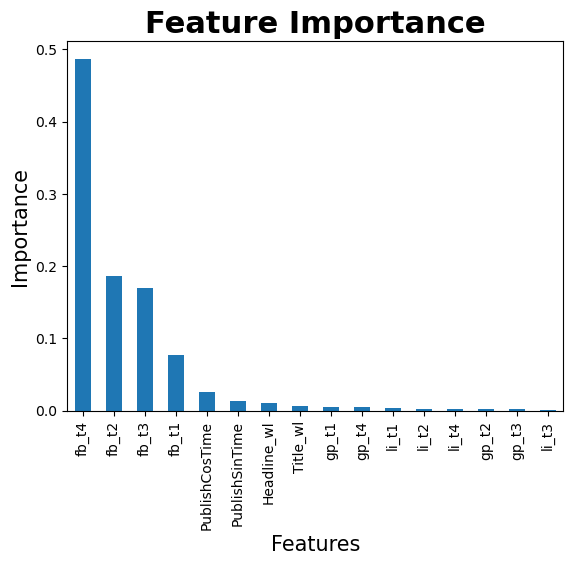

In [82]:
show_feature_importance(master_df, Platform)

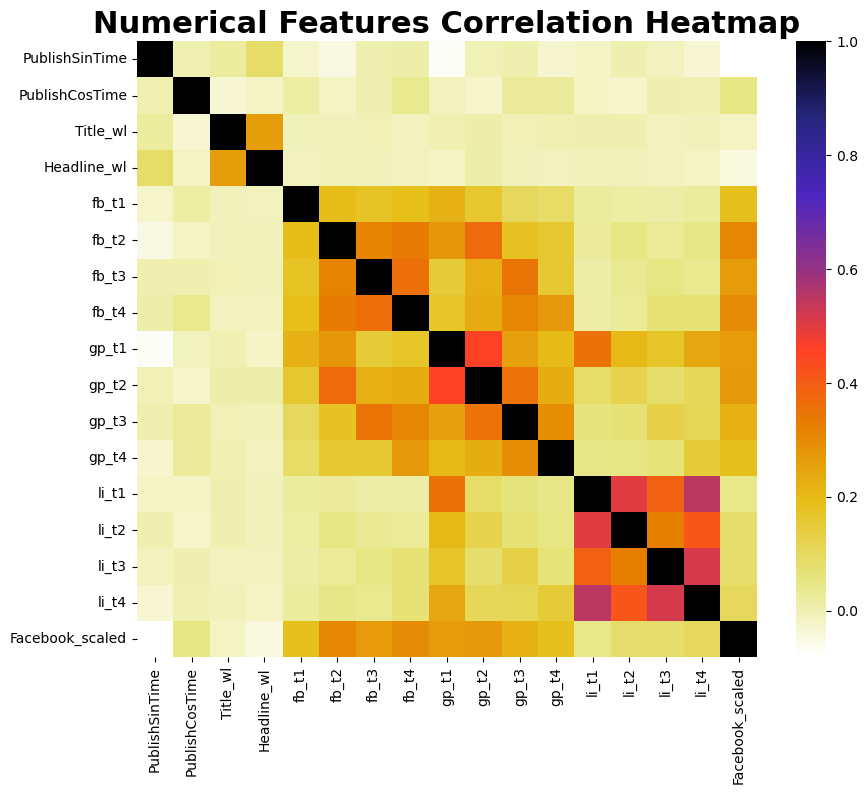

In [83]:
show_correlation_between_features(master_df, Platform)

In [84]:
from sklearn.tree import DecisionTreeRegressor, plot_tree
import matplotlib.pyplot as plt


def visualization(results_df, parameters):

    def shorten_param(param_name):
        if "__" in param_name:
            return param_name.rsplit("__", 1)[1]
        return param_name

    column_results = [f"param_{name}" for name in parameters.keys()]
    column_results += ["mean_test_score", "std_test_score", "rank_test_score"]

    results_df = results_df[column_results].sort_values("mean_test_score", ascending=False)
    results_df = results_df.rename(shorten_param, axis=1)

    for col in results_df.columns:
        if col == 'param_random_state':
            continue
        try:
            results_df[col] = results_df[col].astype(np.float64)
        except:
            continue

    fig = px.parallel_coordinates(
    results_df,
    color="mean_test_score",
    color_continuous_scale=px.colors.sequential.Viridis,
    title='Hyper Parameter Tuning',
    )
    fig.show()


def evaluation_metrics(name, independent_feature_length , y_pred, y_test):

    n = len(y_pred)
    k = independent_feature_length

    metrics_dict = {}
    metrics_dict['MSE'] = [mean_squared_error(y_test,y_pred)]  #MSE
    metrics_dict['RMSE'] = [np.sqrt(mean_squared_error(y_test,y_pred))] #RMSE
    metrics_dict['MAE'] = [mean_absolute_error(y_test,y_pred)] #MAE
    metrics_dict['R2_Score'] = [r2_score(y_test,y_pred)] #R2 Score
    metrics_dict['Adjusted_R2_Score'] = [1 - ((1-metrics_dict['R2_Score'][0])*(n-1)/(n-k-1))] #Adjusted R2 score
    metrics_dict['RMSLE'] = [np.log(np.sqrt(mean_squared_error(y_test,y_pred)))] #RMSLE

    metrics_df = pd.DataFrame(metrics_dict)

    print(metrics_df)


def hyperparameter_tuning(x_train, y_train, model, parameters, tuning_model):

    if tuning_model == 'Halving_Randomized_Search_CV':
        tuned_model = HalvingRandomSearchCV(model, param_distributions = parameters, scoring = "neg_mean_squared_error", n_jobs=-1, factor=3, cv = 3 )

    elif tuning_model == 'Randomized_Search_CV':
        tuned_model = RandomizedSearchCV(model, param_distributions = parameters, scoring = 'neg_mean_squared_error', cv = 3, n_iter = 50, n_jobs=-1)

    else:
        tuned_mode = GridSearchCV(model, param_grid = parameters, scoring = 'neg_mean_squared_error', n_jobs=-1, cv = 3)


    start_time = time.time()

    if type(model).__name__ == 'CatBoostRegressor':
        tuned_model.fit(x_train, y_train, verbose = False)
    else:
        tuned_model.fit(x_train, y_train)

    stop_time = time.time()

    print('*****'*10+f'\nBest Score for {type(model).__name__} : {tuned_model.best_score_}','\n---')
    print(f'Best Parameters for {type(model).__name__} : {tuned_model.best_params_}\n'+'-----'*10)

    print('Elapsed Time:',time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))
    print('======'*5)

    return tuned_model


def perform_ml_algorithm(x_train, x_test, y_train, y_test, model, parameters, social_media, tuning_model):
    print('-----'*10+f'\n{type(model).__name__} for {social_media}\n'+'-----'*10)

    if type(model).__name__ == 'CatBoostRegressor':
        model.fit(x_train, y_train, verbose = False)
    else:
        model.fit(x_train, y_train)
    untuned_pred = model.predict(x_test)
    

          
    y_pred = model.predict(x_test)
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("Actual vs. Predicted Values")
    plt.show()
    
            
    # Evaluation Metrics before tuning
    print(f'\nEvaluation of {type(model).__name__} before tuning:\n'+'-----'*10)
    evaluation_metrics(type(model).__name__, len(list(x_train.columns)), untuned_pred, y_test)

    # Hyper-parameter tuning
    tuned_model = hyperparameter_tuning(x_train, y_train, model, parameters, tuning_model)
    tuned_pred = tuned_model.predict(x_test)

    # Evaluation Metrics after tuning
    print(f'\nEvaluation of {type(model).__name__} after tuning:\n'+'-----'*10)
    evaluation_metrics(type(model).__name__,len(list(x_train.columns)), tuned_pred, y_test)

    visualization(pd.DataFrame(tuned_model.cv_results_), parameters)


def ml_algorithm_implementation(df, model, parameters, social_media, tuning_model, feature_importance = False):

    if feature_importance == False:
        print('########'*8+'\n     <<<< '+f'Tuning Model: {tuning_model}'+' >>>>\n'+'********'*8)

    x_cols = [x for x in df.columns if x not in ['Facebook_scaled','LinkedIn_scaled','GooglePlus_scaled']]

    x = df[x_cols]
    y = df[[f'{social_media}_scaled']]

    x.columns = x.columns.astype(str)
    # Train Test Split
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state=23)

    if feature_importance == True:
        model.fit(x_train, y_train)
        return x_train, model

    perform_ml_algorithm(x_train, x_test, y_train, y_test, model, parameters, social_media, tuning_model)

In [85]:

Tuning_Method = "Halving_Randomized_Search_CV" #@param ["Halving_Randomized_Search_CV", "Grid_Search_CV", "Randomized_Search_CV"]

In [86]:
Social_Media = "Facebook" #@param ["Facebook", "GooglePlus", "LinkedIn"]


In [87]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


################################################################
     <<<< Tuning Model: Halving_Randomized_Search_CV >>>>
****************************************************************
--------------------------------------------------
RandomForestRegressor for Facebook
--------------------------------------------------


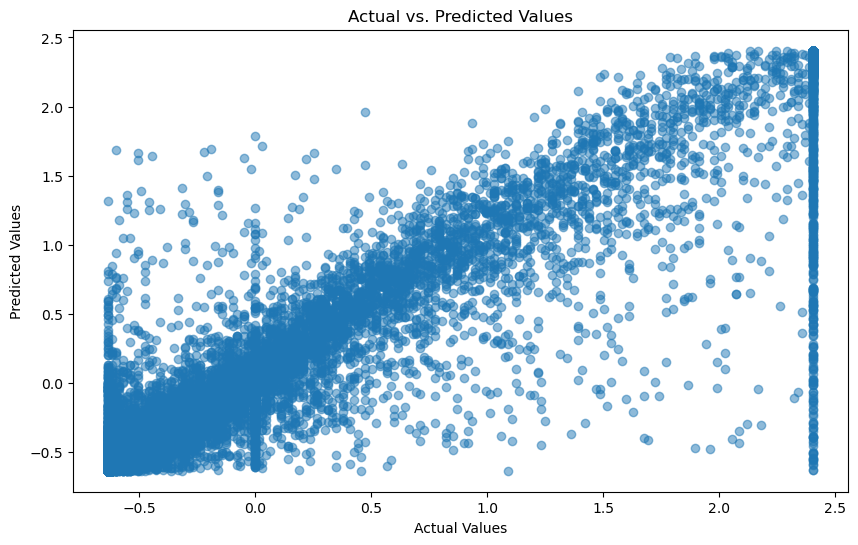


Evaluation of RandomForestRegressor before tuning:
--------------------------------------------------
        MSE      RMSE       MAE  R2_Score  Adjusted_R2_Score     RMSLE
0  0.071674  0.267721  0.107438  0.922485           0.922064 -1.317811
**************************************************
Best Score for RandomForestRegressor : -0.27197728116560344 
---
Best Parameters for RandomForestRegressor : {'random_state': 23, 'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 10}
--------------------------------------------------
Elapsed Time: 00:00:54

Evaluation of RandomForestRegressor after tuning:
--------------------------------------------------
        MSE     RMSE       MAE  R2_Score  Adjusted_R2_Score     RMSLE
0  0.165747  0.40712  0.274219  0.820747           0.819772 -0.898647


In [89]:
from sklearn.ensemble import RandomForestRegressor

# Random Forest
parameters_random_forest = {"n_estimators": [50, 100, 150],
                            "max_depth": [None, 5, 10],
                            "min_samples_split": [2, 5, 10],
                            "min_samples_leaf": [1, 2, 4],
                            "max_features": ["auto", "sqrt", "log2"],
                            "random_state": [23]}

ml_algorithm_implementation(master_df, RandomForestRegressor(random_state=0), parameters_random_forest, Social_Media, Tuning_Method, False)


In [ ]:
from sklearn.ensemble import ExtraTreesRegressor

# Extra Trees
parameters_extra_trees = {"n_estimators": [50, 100, 150],
                          "max_depth": [None, 5, 10],
                          "min_samples_split": [2, 5, 10],
                          "min_samples_leaf": [1, 2, 4],
                          "max_features": ["auto", "sqrt", "log2"],
                          "random_state": [23]}

ml_algorithm_implementation(master_df, ExtraTreesRegressor(random_state=0), parameters_extra_trees, Social_Media, Tuning_Method, False)


In [ ]:
# Decision Tree
parameters_decision_tree = {"splitter":["best","random"],
            "max_depth" : [None,5,7,9],
           "min_samples_leaf":[1,2,3,4,5],
           "min_weight_fraction_leaf":[0.0, 0.3,0.4,0.5],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,30,40,50,60],
           'random_state':[23]}

ml_algorithm_implementation(master_df, DecisionTreeRegressor( random_state = 0), parameters_decision_tree, Social_Media, Tuning_Method, False)



In [ ]:
# Catboost
parameters_catboot = {'iterations': [100, 150, 200, 250],
        'learning_rate': [0.01,0.02,0.03,0.04],
        'depth': [4,5,6,7,8,9, 10],
        'l2_leaf_reg': [0.2, 0.5, 1, 3],
        'random_state':[23]}

ml_algorithm_implementation(master_df, cb.CatBoostRegressor(loss_function='RMSE',random_state = 23), parameters_catboot, Social_Media, Tuning_Method, False)

In [ ]:
# LightGBM
parameters_lightgbm = {'n_estimators':[50,100, 120,150,200],
                       'learning_rate':[.001,0.01,.1],
                       'max_depth':[-1,1,2,4],
                       'subsample':[.5,.75,1],
                       'random_state':[25]}

ml_algorithm_implementation(master_df, LGBMRegressor(random_state = 20), parameters_lightgbm, Social_Media, Tuning_Method, False)

In [ ]:
#Gradient Boosting
param_gbr={'n_estimators':[50,100,200, 300],
            'learning_rate':[.001,0.01,.1,1],
            'max_depth':[1,2,3,4,5],
            'subsample':[.5,.75,1,.1],
            'random_state':[3]}

ml_algorithm_implementation(master_df, GradientBoostingRegressor(random_state = 23), param_gbr, Social_Media, Tuning_Method, False)


In [ ]:
# #KNN
# param_knn =  { 'n_neighbors' : [5,7,9,11,13,15],
#                'weights' : ['uniform','distance'],
#                'metric' : ['minkowski','euclidean','manhattan'],
#               'n_jobs':[-1]}

# ml_algorithm_implementation(master_df, KNeighborsRegressor(), param_knn, Social_Media, Tuning_Method, False)

In [ ]:
# XGBoost
parameters_xgboost = {'n_estimators':[50,100,200, 300],
            'learning_rate':[.001,0.01,.1,1],
            'max_depth':[1,2,3,4,5],
            'subsample':[.5,.75,1,.1],
            'random_state':[3]}

ml_algorithm_implementation(master_df, XGBRegressor(random_state=23), parameters_xgboost, Social_Media, Tuning_Method, False)


In [ ]:
# Social_Media = "Facebook" #@param ["Facebook", "GooglePlus", "LinkedIn"]


In [ ]:
# x_train, model = ml_algorithm_implementation(master_df, LGBMRegressor(random_state = 20), None, Social_Media, None, True)
# explainer = shap.TreeExplainer(model)
# shap_values = explainer.shap_values(x_train)

In [ ]:
# shap.initjs()

# def show_force_plot(n_plots = 5):
#     for i in range(0, n_plots):
#         index = random.randint(0,len(shap_values))
#         shap.force_plot(explainer.expected_value, shap_values[index], features=x_train.iloc[index], feature_names=x_train.columns, matplotlib=True)


# def show_feature_importance_by_best_model():
#     plt.subplot(1,1,1)
#     shap.summary_plot(shap_values = shap_values, features = x_train, feature_names = x_train.columns, plot_size=None)
#     plt.subplot(1,2,1)
#     shap.summary_plot(shap_values = shap_values, features = x_train, feature_names = x_train.columns, plot_type='bar', plot_size=None)

In [ ]:
# show_force_plot(10)

In [ ]:
# show_feature_importance_by_best_model()

In [ ]:
# # Support Vector Machine (SVM)
# from sklearn.svm import SVR

# parameters_svm = {'kernel': ['linear', 'rbf', 'poly'],
#                   'C': [0.1, 1, 10],
#                   'epsilon': [0.01, 0.1, 0.2]}

# ml_algorithm_implementation(master_df, SVR(), parameters_svm, Social_Media, Tuning_Method, False)
